In [1]:
import sys
sys.path.append('../')
import pdb
import pycm
from glob import glob
import torch
from torch import nn
import cv2
import os
from PIL import Image
from skimage import io, transform
import matplotlib.pyplot as plt
import seaborn as sn
from models import Model
import matplotlib.image as mpimg
import pandas as pd
from torchvision.datasets.folder import pil_loader
import random
import numpy as np
from torchsummary import summary
import pretrainedmodels
from sklearn.model_selection import KFold, StratifiedKFold
from sklearn.metrics import *
from tensorboard_logger import * 
from dataloader import *
from submission import *
from albumentations import torch as AT
from pycm import *
os.environ['CUDA_VISIBLE_DEVICES']=""
import warnings
warnings.filterwarnings("ignore")

%matplotlib inline

#### The notebook can be used to analyse predictions of trained models on train set. Test set predictions of two models can also be compared.
See, we can compare the cm obj files saved for train and val for each epoch but dude the dataloader is doing weighted sampling, we don't actually get to see the predictions on the real training set, so yeah let them be for logger.py

In [2]:
def get_uniques(path):
    '''takes predicted csv's and returns unique counts'''
    pred = pd.read_csv(path)
    print(np.unique(pred.diagnosis.values, return_counts=True))

# def get_preds(pred, threshold):
#     '''pred: [nx5], threshold: float'''
#     y1 = pred > threshold
#     y1 = np.clip(y1.astype(int).sum(axis=1) - 1, 0, 4)
#     return y1

def get_preds(arr, threshold, num_cls=5):
    """ takes in thresholded predictions (num_samples, num_cls) and returns (num_samples,)
    [3], arr needs to be a numpy array, NOT torch tensor"""
    arr = arr > threshold
    mask = arr == 0
    # pdb.set_trace()
    return np.clip(np.where(mask.any(1), mask.argmax(1), num_cls) - 1, 0, num_cls - 1)


def predict(X, coef):
    # [0.15, 2.4, ..] -> [0, 2, ..]
    X_p = np.copy(X)
    for i, pred in enumerate(X_p):
        if pred < coef[0]:
            X_p[i] = 0
        elif pred >= coef[0] and pred < coef[1]:
            X_p[i] = 1
        elif pred >= coef[1] and pred < coef[2]:
            X_p[i] = 2
        elif pred >= coef[2] and pred < coef[3]:
            X_p[i] = 3
        else:
            X_p[i] = 4
    return X_p.astype('int')



In [3]:
get_uniques('../weights/submission713.csv') 
get_uniques('../weights/submission736.csv') 
get_uniques('../weights/submission73.csv') 
get_uniques('../weights/submission785.csv') 
get_uniques('../weights/submission812.csv') 

(array([0, 1, 2, 3, 4]), array([227, 416, 931, 316,  38]))
(array([0, 1, 2, 3, 4]), array([292, 344, 998, 229,  65]))
(array([0, 1, 2, 3, 4]), array([ 301,  227, 1002,  345,   53]))
(array([0, 1, 2, 3, 4]), array([ 292,  180, 1178,  220,   58]))
(array([0, 1, 2, 3, 4]), array([ 331,  195, 1145,  193,   64]))


### Load predicted test npy files and compute the optimized threshold using the best public submission.csv

In [10]:
#npy_folder = '../weights/15-7_resnext101_32x4d_v0_fold0_bgcpold256/test_npy/'
#npy_folder = '../weights/17-7_resnext101_32x4d_v0_fold0_bgcpcold256reg/test_npy/'
#npy_folder = '../weights/18-7_resnext101_32x16d_fold0_bgccpold/test_npy/'
npy_folder = '../weights/26-7_efficientnet-b5_fold1_pos/test_npy/'
files = glob(os.path.join(npy_folder, '*.npy'))
preds = {}
for file in files:
    ep = file.split('/')[-1]
    preds[ep] = np.load(file)
#preds.keys()

In [11]:
y_test = pd.read_csv('../weights/submission812.csv')['diagnosis'].values.reshape(-1, 1)

In [12]:
#cohen_kappa_score(y_test1, y_test, weights="quadratic")

In [13]:

def compute_dist(threshold, pred):
    y1 = get_preds(pred, threshold)
    #distance = np.mean((y1 - y_test)**2)
    score = cohen_kappa_score(y1, y_test, weights='quadratic')
    return 1 - score

def get_optimised_threshold(pred):
    initial_coeffs = np.array([0.5, 0.5, 0.5, 0.5, 0.5])
    simplex = scipy.optimize.minimize(
        compute_dist, initial_coeffs, args=(pred,), method='nelder-mead'
    )
    best_threshold = simplex['x']
    return best_threshold

for key in sorted(preds.keys(), key=lambda x: int(x.split('.')[0][9:])):
    pred, val_bt = preds[key]# val_bt = validation best threhsold
    #best_threshold = get_optimised_threshold(pred)
    best_threshold = val_bt
    base_threshold = np.array([0.5, 1.5, 2.5, 3.5])
    #print(f"\nval best thr: {val_bt}")
    print(f'\n{key}: {best_threshold}')
    pred1 = predict(pred, best_threshold)
    pred2 = predict(pred, base_threshold)
    score = cohen_kappa_score(y_test, pred1, weights="quadratic")
    acc = accuracy_score(y_test, pred1)
    print(f'score: {score}, acc: {acc}')
    print('best:', np.unique(pred1, return_counts=True)[1])
    print('base:', np.unique(pred2, return_counts=True)[1])


test_ckpt0_0.npy: [0.51902766 1.31400551 2.63278649 3.47476972]
score: 0.8224505389752128, acc: 0.7474066390041494
best: [ 356  253 1199  109   11]
base: [ 355  358 1042  162   11]

test_ckpt0.npy: [0.51902766 1.31400551 2.63278649 3.47476972]
score: 0.8224505389752128, acc: 0.7474066390041494
best: [ 356  253 1199  109   11]
base: [ 355  358 1042  162   11]

test_ckpt1.npy: [0.5   1.575 2.5   3.5  ]
score: 0.7987195351335237, acc: 0.6804979253112033
best: [361 447 951 159  10]
base: [ 361  390 1008  159   10]

test_ckpt0_1.npy: [0.51902766 1.31400551 2.63278649 3.47476972]
score: 0.8224505389752128, acc: 0.7474066390041494
best: [ 356  253 1199  109   11]
base: [ 355  358 1042  162   11]

test_ckpt0_2.npy: [0.51902766 1.31400551 2.63278649 3.47476972]
score: 0.8224505389752128, acc: 0.7474066390041494
best: [ 356  253 1199  109   11]
base: [ 355  358 1042  162   11]

test_ckpt2.npy: [0.52690157 1.51735693 2.60181636 2.9108243 ]
score: 0.8236787143766925, acc: 0.7214730290456431
best:

In [14]:
pred, th = preds['test_ckpt17.npy']
best_threshold = [0.5, 1.5, 2.5, 3.5]
pred_ = predict(pred, best_threshold)
print(np.unique(pred_, return_counts=True))
pred_ = predict(pred, th)
print(np.unique(pred_, return_counts=True))


(array([0, 1, 2, 3, 4]), array([ 312,  379, 1028,  197,   12]))
(array([0, 1, 2, 3, 4]), array([ 340,  208, 1100,  199,   81]))


### Analysis of model on train/val using cm obj files

In [2]:
train_cm = ConfusionMatrix(file=open('../weights/19-7_efficientnet-b5_fold1_bgccpold/logs/cmtrain_10.obj', 'r'))
val_cm = ConfusionMatrix(file=open('../weights/19-7_efficientnet-b5_fold1_bgccpold/logs/cmval_10.obj', 'r'))

In [6]:
ConfusionMatrix?

In [8]:
train_cm.predict_vector

In [3]:
train_cm.print_matrix()

Predict    0          1          2          3          4          
Actual
0          1904       77         6          1          0          

1          83         212        146        4          2          

2          16         88         839        123        1          

3          1          3          116        234        29         

4          0          1          45         82         118        




In [5]:
val_cm.print_matrix()

Predict   0         1         2         3         4         
Actual
0         314       11        1         0         0         

1         17        31        19        1         0         

2         3         18        131       8         0         

3         0         0         27        28        8         

4         0         0         9         11        18        




Effnet fold1, ckpt10 is my best performing model so far. LB: 0.812, 
Things to notice:
* Val thresholds optimized were used for val metric val_cm.

In [10]:
val_cm.overall_stat

{'Overall ACC': 0.7969465648854962,
 'Kappa': 0.6912228094240578,
 'Overall RACC': 0.3423949653283608,
 'SOA1(Landis & Koch)': 'Substantial',
 'SOA2(Fleiss)': 'Intermediate to Good',
 'SOA3(Altman)': 'Good',
 'SOA4(Cicchetti)': 'Good',
 'SOA5(Cramer)': 'Strong',
 'SOA6(Matthews)': 'Moderate',
 'TPR Macro': 0.6311902383922033,
 'PPV Macro': 0.6865924424290046,
 'ACC Macro': 0.9187786259541983,
 'F1 Macro': 0.6515875767370725,
 'TPR Micro': 0.7969465648854962,
 'PPV Micro': 0.7969465648854962,
 'F1 Micro': 0.7969465648854962,
 'Scott PI': 0.6908869944734718,
 'Gwet AC1': 0.7570484093907909,
 'Bennett S': 0.7461832061068702,
 'Kappa Standard Error': 0.023901986262936624,
 'Kappa 95% CI': (0.644374916348702, 0.7380707024994135),
 'Chi-Squared': 1028.5943993206718,
 'Phi-Squared': 1.57037312873385,
 'Cramer V': 0.6265726471714692,
 'Chi-Squared DF': 16,
 '95% CI': (0.7661391545353836, 0.8277539752356088),
 'Standard Error': 0.015718066505159483,
 'Response Entropy': 1.788741071801734,
 'Ref

In [9]:
np.mean(list(val_cm.class_stat['TPR'].values()))

0.6311902383922033

In [ ]:
def get_cms(pred_csv_path, fold, total_folds):
    '''useless, use cm_obj files instead'''
    '''takes predicted csv and fold, returns confusion matrices of train and validation set for that predictions'''
    preds = pd.read_csv(pred_csv_path)
    actual = pd.read_csv('../data/train.csv')
    df = preds.copy()
    df['pred'] = preds['diagnosis']
    df['actual'] = actual['diagnosis']
    df = df.drop('diagnosis', axis=1)
    # use `fold` to get the indices of train and val images in the actual df
    bad_indices = np.load('../data/bad_train_indices.npy')
    actual = actual.drop(df.index[bad_indices]) # remove duplicates having diff diagnosis
    kfold = StratifiedKFold(total_folds, shuffle=True, random_state=69)  # 20 splits
    train_idx, val_idx = list(kfold.split(actual["id_code"], actual["diagnosis"]))[fold]
    train_df, val_df = df.iloc[train_idx], df.iloc[val_idx]
    
    train_cm = ConfusionMatrix(train_df.actual.values, train_df.pred.values)
    val_cm = ConfusionMatrix(val_df.actual.values, val_df.pred.values)
    
    return train_cm, val_cm

In [ ]:
pred_csv_path = '../weights/10-7_densenet121_fold0_bengrahmscolor/ckpt38.csv'
fold = 0
total_folds=5
train_cm, val_cm = get_cms(pred_csv_path, fold, total_folds)

In [84]:
train_cm = ConfusionMatrix(file=open('../weights/8-7_resnext101_32x4d_fold6/logs/cmtrain_35.obj', 'r'))
val_cm = ConfusionMatrix(file=open('../weights/8-7_resnext101_32x4d_fold6/logs/cmval_35.obj', 'r'))

In [83]:
train_cm.print_matrix()

Predict    0          1          2          3          4          
Actual
0          1287       27         3          0          0          

1          20         465        53         2          13         

2          8          63         587        29         29         

3          0          1          35         203        30         

4          4          15         53         32         266        




In [85]:
val_cm.print_matrix()

Predict   0         1         2         3         4         
Actual
0         175       2         0         0         0         

1         2         26        6         0         2         

2         3         19        61        10        5         

3         0         0         3         10        6         

4         0         2         8         1         17        




In [34]:
cm = val_cm
cm.matrix

{0: {0: 314, 1: 11, 2: 1, 3: 0, 4: 0},
 1: {0: 17, 1: 31, 2: 19, 3: 1, 4: 0},
 2: {0: 3, 1: 18, 2: 131, 3: 8, 4: 0},
 3: {0: 0, 1: 0, 2: 27, 3: 28, 4: 8},
 4: {0: 0, 1: 0, 2: 9, 3: 11, 4: 18}}

In [35]:
cm.TP, cm.FP, cm.TN, cm.FN

({0: 314, 1: 31, 2: 131, 3: 28, 4: 18},
 {0: 20, 1: 29, 2: 56, 3: 20, 4: 8},
 {0: 309, 1: 558, 2: 439, 3: 572, 4: 609},
 {0: 12, 1: 37, 2: 29, 3: 35, 4: 20})

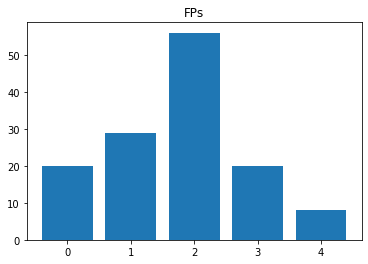

In [47]:
plt.bar(cm.FP.keys(), cm.FP.values())
plt.title('FPs');

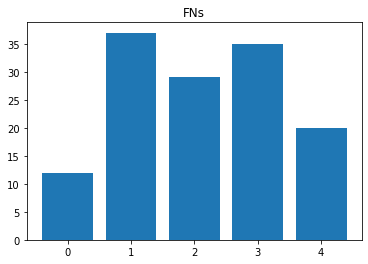

In [48]:
plt.bar(cm.FN.keys(), cm.FN.values())
plt.title('FNs');

### Let's plot some mispredictions

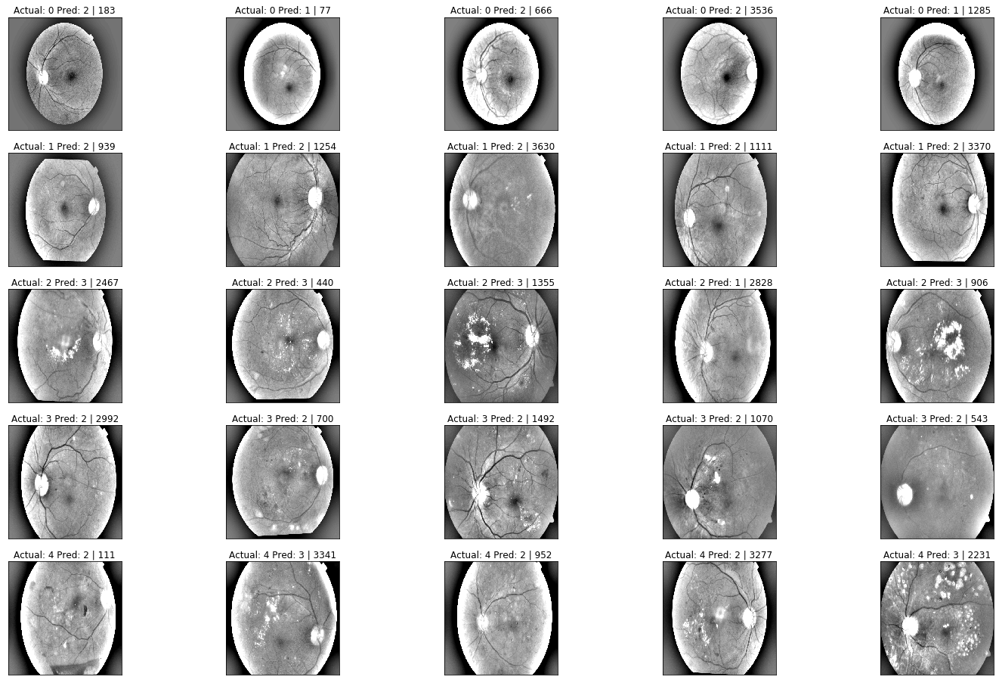

In [18]:
fig = plt.figure(figsize=(25, 16))
IMG_SIZE=512
for class_id in sorted(diff['actual'].unique()):
    samples = len(diff[diff['actual'] == class_id])
    samples = 5 if samples > 5 else samples # make sure there are atleast 5 predictions to plot or go for whatever is available
    for i, (idx, row) in enumerate(diff.loc[diff['actual'] == class_id].sample(samples, random_state=69).iterrows()):
        ax = fig.add_subplot(5, 5, class_id * 5 + i + 1, xticks=[], yticks=[])
        path=f"../data/train_images/{row['id_code']}.png"
        image = cv2.imread(path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
        image=cv2.addWeighted ( image,4, cv2.GaussianBlur( image , (0,0) , IMG_SIZE/10) ,-4 ,128) # the trick is to add this line
        plt.imshow(image, cmap='gray')
        ax.set_title('Actual: %d Pred: %d | %s' % (class_id, row['pred'], idx) )

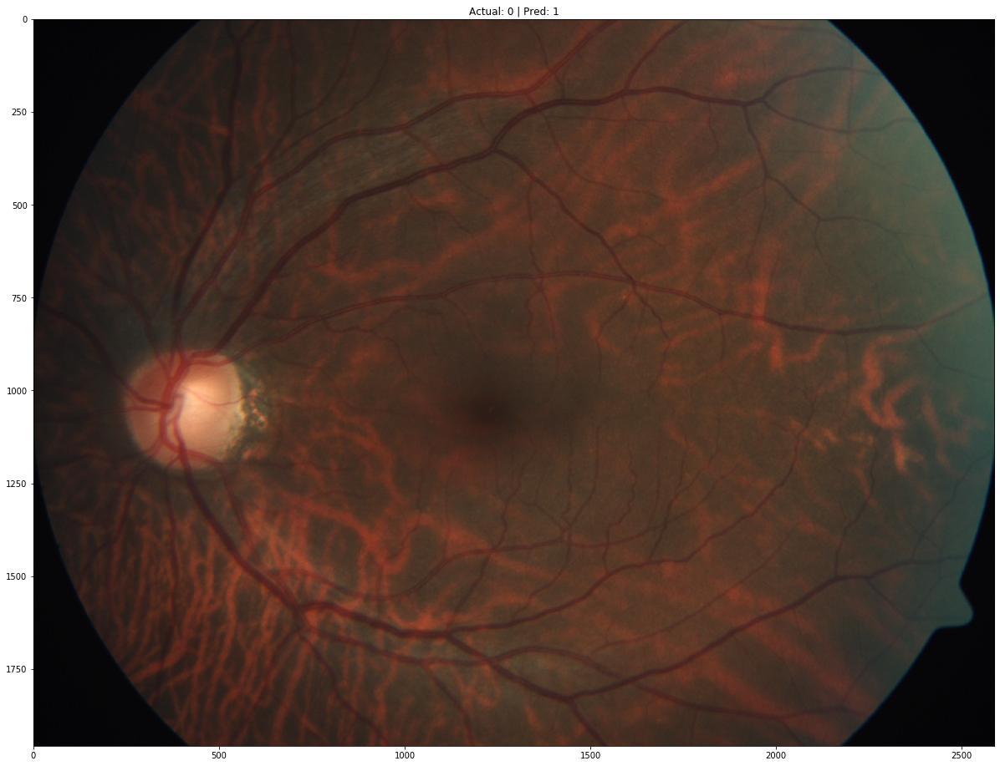

In [86]:
#i = 1546 
i = 494
#img = mpimg.imread() # remember the indices of diff are same as df
path = '../data/train_images/' + df.iloc[i]['id_code'] + '.png'
image = cv2.imread(path)
#image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
#image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
#|image=cv2.addWeighted (image, 4, cv2.GaussianBlur( image , (0,0) , IMG_SIZE/10) ,-4 ,128) # the trick is to add this line
fig = plt.figure(figsize=(25, 16))
#plt.imshow(image, cmap='gray')
plt.imshow(image, )
plt.title("Actual: %d | Pred: %d" % (df.iloc[i]['actual'], df.iloc[i]['pred']))
plt.show()

#####  https://www.eyeops.com/contents/our-services/eye-diseases/diabetic-retinopathy

In [87]:
image = cv2.resize(image, (IMG_SIZE, IMG_SIZE, 3))


TypeError: function takes exactly 2 arguments (3 given)

### Base model Activation heatmaps

In [9]:
# Visualize feature maps
activation = {}
def get_activation(name):
    def hook(model, input, output):
        activation[name] = output.detach()
    return hook


In [10]:
model_name = "densenet121"
model = Model(model_name, 5)

In [11]:
model.model.features.norm5.register_forward_hook(get_activation('norm5'))

In [12]:
fold =0
total_folds = 10
images_folder = '../data/train_images/'
df_path = '../data/train.csv'
size = 224
mean = (0.485, 0.456, 0.406)
std = (0.229, 0.224, 0.225)
dataloaders = {
    phase: provider(
        fold,
        total_folds,
        images_folder,
        df_path,
        phase,
        size,
        mean,
        std,
        batch_size=1,
        num_workers=1,
    )
    for phase in ["train", "val"]
}

def unnormalize(img):
    mean = torch.as_tensor([0.485, 0.456, 0.406])
    std = torch.as_tensor([0.229, 0.224, 0.225])
    #return (img * std) + mean
    for t, m, s in zip(img, mean, std):    
        t.mul_(s).add_(m)
    return img.permute(1, 2, 0)# * 255

In [51]:
batch = next(iter(dataloaders['train']))

In [52]:
fnames, images, labels = batch
output = model(images) # during forward pass, model populates the activation dictionary using forward hook

In [53]:
act = activation['norm5'] # 1, 1024, 7, 7
mean_act = torch.mean(act[0], 0) # take mean across 1024 channels

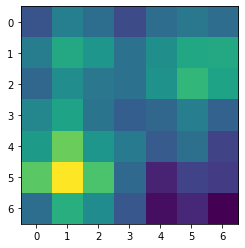

In [54]:
plt.imshow(mean_act, cmap='viridis')

In [55]:
unimage = unnormalize(images[0].clone())

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


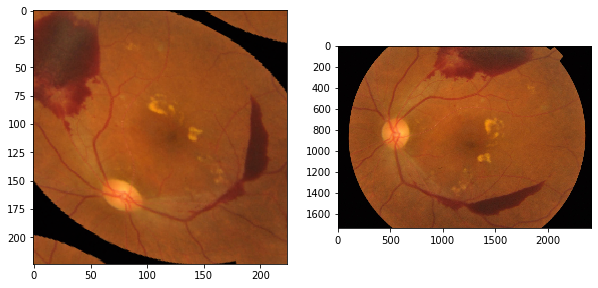

In [63]:
plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.imshow(unimage);
plt.subplot(1, 2, 2)
plt.imshow(mpimg.imread(f'../data/train_images/{fnames[0]}.png')); 
plt.show(); # original image

In [84]:
torch.max(unimage), torch.min(unimage)

(tensor(0.8902), tensor(0.))

In [87]:
torch.max(images), torch.min(images)

(tensor(1.7694), tensor(-2.1179))

### Where's model failing? Hard examples? Analysing train set

It's utmost important to analyse the predictions on train and val set seperately

In [2]:
#train_pred, best_thresholds = np.load('../weights/21-7_efficientnet-b5_fold1_bgccpo300aug2/train_npy/train_ckpt15.npy')
train_pred, best_thresholds = np.load('../weights/24-7_efficientnet-b5_fold1_poscwwd/train_npy/train_ckpt29.npy')
base_th = [0.5, 1.5, 2.5, 3.5]
train_bestpred = predict(train_pred, best_thresholds)
train_basepred = predict(train_pred, base_th)

In [54]:
train_df = pd.read_csv('../data/train.csv')
train_df['bestpred'] = train_bestpred
train_df['basepred'] = train_basepred
train_df['dist'] = abs(train_df['bestpred']-train_df['diagnosis'])

In [55]:
train_df.head()

,id_code,diagnosis,bestpred,basepred,dist
0,000c1434d8d7,2,2,2,0
1,001639a390f0,4,4,4,0
2,0024cdab0c1e,1,1,1,0
3,002c21358ce6,0,0,0,0
4,005b95c28852,0,0,0,0


In [5]:
# qwk in bestpred, basepred
cohen_kappa_score(train_df['basepred'].values, train_df['bestpred'].values, weights="quadratic" )

0.9797408346863566

In [6]:
cohen_kappa_score(train_df['bestpred'].values, train_df['diagnosis'].values, weights="quadratic" )

0.934265636156262

In [7]:
base_diff = train_df.query("diagnosis != basepred")
best_diff = train_df.query("diagnosis != bestpred")

In [9]:
train_df.shape, base_diff.shape, best_diff.shape # base_diff > best_diff means best_thresholds is better

((3662, 4), (576, 4), (510, 4))

In [10]:
cohen_kappa_score(best_diff['bestpred'].values, best_diff['diagnosis'].values, weights="quadratic" )

0.3672952361053071

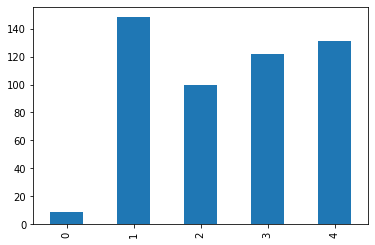

In [11]:
best_diff['diagnosis'].value_counts(sort=False).plot('bar');

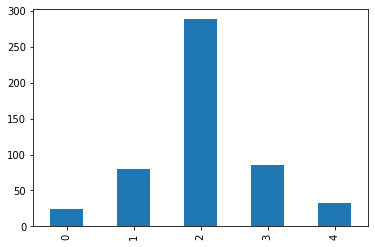

In [12]:
best_diff['bestpred'].value_counts(sort=False).plot('bar');

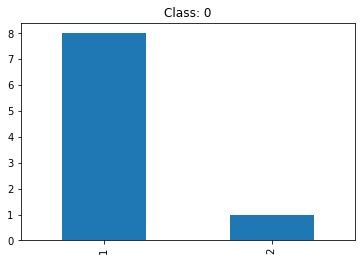

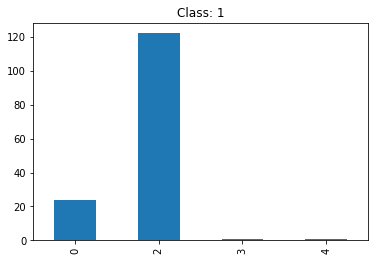

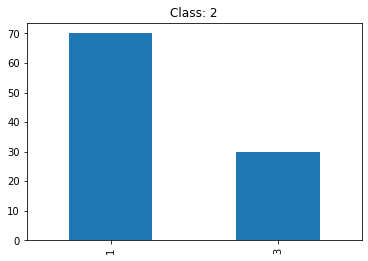

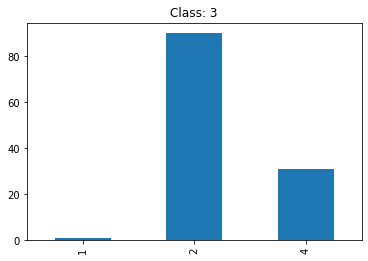

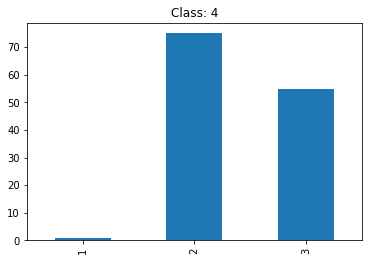

In [13]:
for i in range(5): best_diff[best_diff['diagnosis']==i]['bestpred'].value_counts(sort=False).plot(kind="bar", title=f'Class: {i}'); plt.show()

In [14]:
cm = ConfusionMatrix(best_diff['diagnosis'].values, best_diff['bestpred'].values)

In [15]:
cm.print_matrix()

Predict   0         1         2         3         4         
Actual
0         0         8         1         0         0         

1         24        0         122       1         1         

2         0         70        0         30        0         

3         0         1         90        0         31        

4         0         1         75        55        0         




A lot of 1's are being predicted as 2, 2's are equally distributed to 1 and 3, 4's are being predicted as 3

In [16]:
best_diff.head()

,id_code,diagnosis,bestpred,basepred
13,0104b032c141,3,2,3
32,0243404e8a00,4,2,2
34,02685f13cefd,4,3,3
40,0318598cfd16,4,2,2
45,0369f3efe69b,1,2,2


In [17]:
best_diff.index # indices of hard examples

Int64Index([  13,   32,   34,   40,   45,   46,   47,   49,   56,   61,
            ...
            3620, 3627, 3631, 3634, 3639, 3642, 3650, 3655, 3656, 3659],
           dtype='int64', length=510)

In [43]:
# hard_ex_indices = best_diff.index.tolist()
# train_df = pd.read_csv('../data/train.csv')
# train_df['weight'] = 1
# train_df.at[hard_ex_indices, 'weight'] = 2
# train_df.head()

#### Extremely hard examples

In [18]:
best_diff['dist'] = abs(best_diff['bestpred'] - best_diff['diagnosis'])

In [19]:
best_diff.head()

,id_code,diagnosis,bestpred,basepred,dist
13,0104b032c141,3,2,3,1
32,0243404e8a00,4,2,2,2
34,02685f13cefd,4,3,3,1
40,0318598cfd16,4,2,2,2
45,0369f3efe69b,1,2,2,1


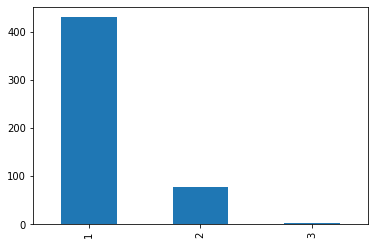

In [29]:
best_diff['dist'].value_counts(sort=False).plot('bar')

In [30]:
extremely_hard_examples = best_diff.query('dist>1')

In [31]:
extremely_hard_examples.shape

(80, 5)

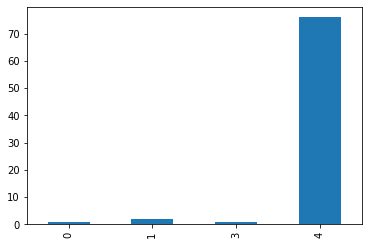

In [33]:
extremely_hard_examples['diagnosis'].value_counts(sort=False).plot('bar')

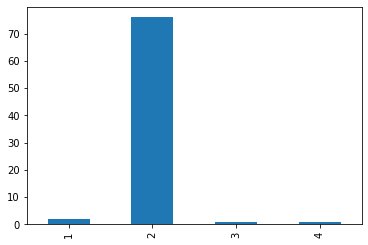

In [34]:
extremely_hard_examples['bestpred'].value_counts(sort=False).plot('bar')

In [35]:
excm = ConfusionMatrix(extremely_hard_examples['diagnosis'].values, extremely_hard_examples['bestpred'].values)
excm.print_matrix()

Predict  0        1        2        3        4        
Actual
0        0        0        1        0        0        

1        0        0        0        1        1        

2        0        0        0        0        0        

3        0        1        0        0        0        

4        0        1        75       0        0        




Extremely hard examples are from class 4, being predicted as 2, If I fix this issue, boi the score is gonna improve

###### Let's visualize these extremely hard examples

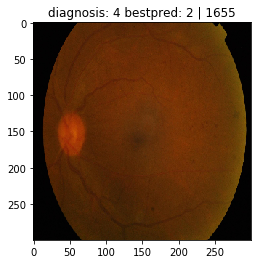

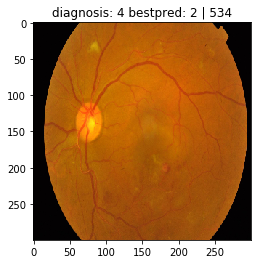

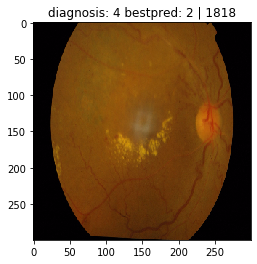

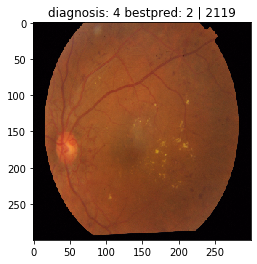

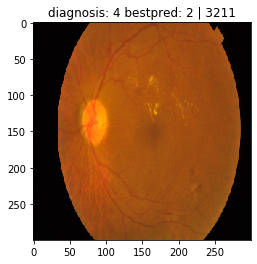

...

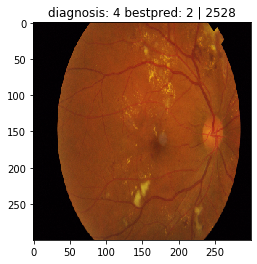

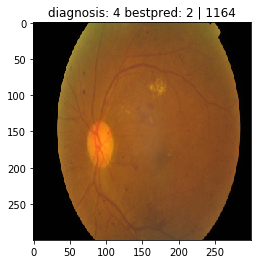

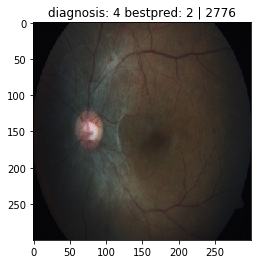

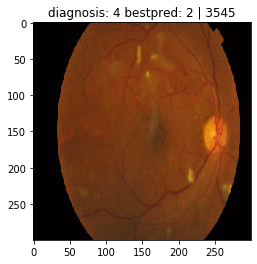

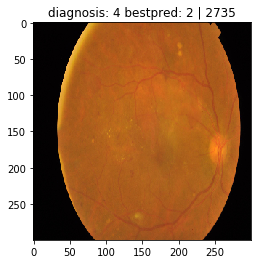

In [37]:
#fig = plt.figure(figsize=(25, 16))
IMG_SIZE=300
# for class_id in sorted(extremely_hard_examples['diagnosis'].unique()):
class_id = 4
samples = len(extremely_hard_examples[extremely_hard_examples['diagnosis'] == class_id])
for i, (idx, row) in enumerate(extremely_hard_examples.loc[extremely_hard_examples['diagnosis'] == class_id].sample(samples, random_state=69).iterrows()):
    path=f"../data/train_images/{row['id_code']}.png"
    image = cv2.imread(path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
    #image=cv2.addWeighted ( image,4, cv2.GaussianBlur( image , (0,0) , IMG_SIZE/10) ,-4 ,128) # the trick is to add this line
    plt.imshow(image)
    plt.title('diagnosis: %d bestpred: %d | %s' % (class_id, row['bestpred'], idx) )
    plt.show()

In [89]:
#np.save('../data/extremely_hard_examples1.npy', extremely_hard_examples.index.values)

#ehe = np.load('../data/extremely_hard_examples1.npy')


In [50]:
blur_list = [ 170,  182,  212,  300,  374,  453,  541,  563,  574,  587,  668,
        677,  832,  921, 1029, 1043, 1071, 1075, 1173, 1178, 1233, 1310,
       1341, 1399, 1472, 1485, 1522, 1587, 1600, 1678, 1695, 1798, 1799,
       1800, 1817, 1882, 1979, 1996, 2047, 2054, 2123, 2223, 2319, 2341,
       2392, 2568, 2621, 2625, 2679, 2717, 2751, 2755, 2815, 2842, 2878,
       2924, 2995, 3004, 3024, 3102, 3174, 3196, 3237, 3346, 3375, 3527,
       3553, 3593, 3600, 3644, 3661]

In [57]:
#ehe = extremely_hard_examples.index.values
train_df.iloc[blur_list].query('dist>0')

,id_code,diagnosis,bestpred,basepred,dist
1310,5b301a6d1ac7,2,1,1,1
1485,681c3c115684,2,1,1,1
1587,6f4719c6bb4b,4,3,3,1
1996,8c0d05233238,3,4,3,1
2568,b191ba0a2b12,3,2,3,1
2621,b6304c545f95,2,1,1,1
3004,d15ca3469b87,2,1,1,1


In [71]:
bad_dup_list = np.load('../data/npy_files/bad_train_indices.npy') # the ones which have a duplicate with different diagnosis
print(len(bad_dup_list))
train_df.iloc[dup_list].query('dist>0')

79


,id_code,diagnosis,bestpred,basepred,dist
812,3a6e9730b298,4,2,2,2
952,4462fba1d2a1,4,3,3,1
1060,4bd941611343,4,2,1,2
1237,55eb405ec71e,4,3,3,1
1807,7f60f2a083d3,1,2,2,1
1957,89ed6a0dd53f,1,2,1,1
2041,8f318a978844,4,3,3,1
2343,a3fcf42ff56d,4,3,3,1
2618,b5c80d0ed0ff,2,3,3,1
2661,b87f9c59748b,4,2,3,2


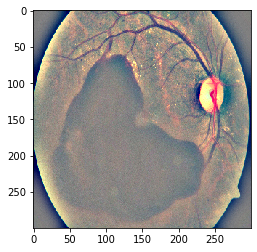

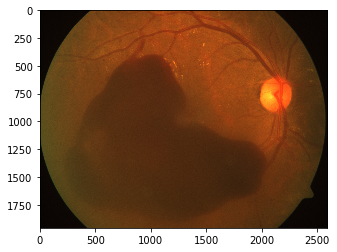

In [77]:
plt.imshow(np.load('../data/npy_files/bgcc300/4bd941611343.npy')); plt.show()
img = cv2.imread('../data/train_images/4bd941611343.png')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img); plt.show()

In [68]:
dup_with_samediag_list = np.load('../data/npy_files/dups_with_same_diagnosis.npy')
print(len(dup_with_samediag_list))
train_df.iloc[dup_with_samediag_list].query('dist>0')

219


,id_code,diagnosis,bestpred,basepred,dist
236,11242a67122d,4,3,3,1
433,1e9224ccca95,4,2,2,2
502,23d7ca170bdb,2,1,1,1
616,2b48daf24be0,3,2,2,1
679,3044022c6969,1,2,1,1
758,36677b70b1ef,1,2,2,1
1300,5a36cea278ae,2,1,1,1
1446,65c958379680,4,3,3,1
1580,6e92b1c5ac8e,3,2,2,1
1723,79ce83c07588,1,0,1,1


What's the for these getting incorrect predictions? were they in val set?

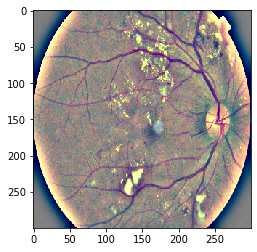

In [67]:
plt.imshow(np.load('../data/npy_files/bgcc300/c0e509786f7f.npy'))

In [52]:
len([x for x in blur_list if x in extremely_hard_examples.index.values])

0

In [57]:
#np.save('../data/hard_examples1.npy', best_diff.index.values)

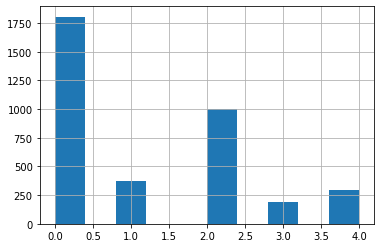

In [38]:
train_df['diagnosis'].hist()

### Why is there so much variation in the test predictions?

In [52]:
# let's generate multiple test predictions from a same model

In [171]:
test0, best_thresholds = np.load('../weights/23-7_efficientnet-b5_fold1_po3005e-6/test_npy/test_ckpt28_0.npy')
test = {
    0: test0
}
for i in range(1, 5):
    test[i] = np.load(f'../weights/23-7_efficientnet-b5_fold1_po3005e-6/test_npy/test_ckpt28_{1}.npy')[0]

In [172]:
pred = {}
for i in range(5):
    pred[i] = predict(test[i], best_thresholds)

In [173]:
df = pd.DataFrame()

In [174]:
for i in range(5):
    df[f'pred{i}'] = pred[i].reshape(-1)

In [175]:
df.head()

,pred0,pred1,pred2,pred3,pred4
0,2,2,2,2,2
1,3,3,3,3,3
2,3,3,3,3,3
3,2,2,2,2,2
4,2,2,2,2,2


In [176]:
df.query('pred0 == pred1 == pred2 == pred3 == pred4').shape, df.shape

((1861, 5), (1928, 5))

with tta=2: 1928 - 1824 = 104 cases are varying. 0:55
#with tta=4: 99 cases are varying. 1:22
#with tta=5: 89 cases are varying. 1:22
#with tta=6: 76 cases are varying. 1:48 minutes per epoch
#with tta=6: 94 cases are varying. 1:48 minutes per epoch
#with tta=8: 88 cases are varying. 2:15 minutes per epoch
#with tta=10: 67
#with no tta, got ZERO variation, all predictions were same